# prepare

In [2]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 42.0 MB/s eta 0:00:00


In [ ]:
!mkdir -p /content/rgb/test
!cp -r /path/to/rgb/test/* /content/rgb/test/

In [ ]:
!mkdir -p /content/lwir/test
!cp -r /path/to/lwir/test/* /content/lwir/test/

In [ ]:
!mkdir -p /content/models
!cp -r /path/to/models* /content/models/

# main


In [ ]:
import sys
sys.path.append('/path/to/project')

In [ ]:
from ultralytics import YOLO
import pandas as pd
import os
from functions.pairs import form_pairs, pairs_to_dict, get_lwir_paths
from functions.single_model_predict import predict_images
from functions.ensemble import results_fusion
from functions.helpers import filter_low_confidence, filter_results
from functions.evaluation import evaluate_results, plot_confusion_matrix
from functions.visualization import show_fp_images, show_fn_images
from functions.parsing import parse_filename

In [8]:
# Завантаження даних
rgb_test_path = '/content/rgb/test'
lwir_test_path = '/content/lwir/test'
rgb_images_path = rgb_test_path + '/images'
lwir_images_path = lwir_test_path + '/images'

In [ ]:
RGB_IMG_SIZE = (1216, 1936)
LWIR_IMG_SIZE = (512, 640)
THRESHOLD_RGB = 0.55
THRESHOLD_LWIR = 0.0
IOU_THRESHOLD = 0.5
RGB_OVERLAP = 0.8
CLASS_NAMES = ['other', 'PFM-1', 'PMN', 'M6', 'TMA-2', 'TC-3.6']

In [ ]:
# Створення пар зображень за найближчим значенням timestampnanosec
pairs_df = form_pairs(rgb_images_path, lwir_images_path, 'image_pairs.csv')
pair_dict = pairs_to_dict(pairs_df)

pairs count: 570


In [ ]:
# Завантаження моделей
model_rgb = YOLO("/content/models/rgb.pt")
model_lwir = YOLO("/content/models/lwir.pt")

In [ ]:
# RGB інференс
rgb_results = predict_images(model_rgb, rgb_images_path, 'predictions_rgb.json', c=0.1)
print(f"RGB results: {len(rgb_results)}")

# Фільтрація за впевненістю
rgb_lowconfidence = filter_low_confidence(rgb_results, THRESHOLD_RGB)
print(f"Low confidence objects: {len(rgb_lowconfidence)}")

RGB results: 1069
Low confidence objects: 134


In [ ]:
# LWIR інференс для зображень з об'єктами низького confidence
selected_lwir_paths = get_lwir_paths(rgb_lowconfidence, pair_dict, lwir_images_path)
lwir_results = predict_images(model_lwir, selected_lwir_paths, 'predictions_lwir.json', c=0.1)
print(f"LWIR results: {len(lwir_results)}")

LWIR results: 80


In [ ]:
# Ансамбль - злиття результатів
notanobjectlist = results_fusion(
    rgb_lowconfidence, lwir_results, pair_dict,
    RGB_IMG_SIZE, LWIR_IMG_SIZE,
    IOU_THRESHOLD, RGB_OVERLAP
)
print(f"Objects to remove: {len(notanobjectlist)}")

Objects to remove: 32


In [ ]:
# Фільтрація результатів
filtered_rgb_results = filter_results(rgb_results, notanobjectlist)
print(f"Initial: {len(rgb_results)}, After filtering: {len(filtered_rgb_results)}")

Initial: 1069, After filtering: 1037


In [20]:
all_rgb_files = set(os.listdir(rgb_images_path))
rgb_files_with_objects = set([res["file"] for res in filtered_rgb_results])
empty_rgb_files = list(all_rgb_files - rgb_files_with_objects)
print(f"Empty RGB detections (after filtering): {len(empty_rgb_files)}")

Empty RGB detections (after filtering): 60


In [ ]:
# для зображень без знайдених об'єктів - інференс LWIR 
lwir_emptyimgs_results = []

if empty_rgb_files:
    emptyimgs_lwir_paths = []

    for rgb_file in empty_rgb_files:
        ts_sec, ts_nsec = parse_filename(rgb_file)
        key = (ts_sec, ts_nsec)
        if key in pair_dict:
            lwir_file = pair_dict[key]
            emptyimgs_lwir_paths.append(os.path.join(lwir_images_path, lwir_file))

    if emptyimgs_lwir_paths:
        lwir_emptyimgs_results = predict_images(
            model_lwir,
            emptyimgs_lwir_paths,
            'predictions_foremptyimgs_lwir.json',
            c=0.1
        )
        print(f"objects count: {len(lwir_emptyimgs_results)}")


objects count: 0


In [ ]:
final_results = filtered_rgb_results + lwir_emptyimgs_results

In [32]:
# Збереження фінальних результатів
df = pd.DataFrame(final_results)
df.to_csv("final_rgblwir_results.csv", index=False)

In [ ]:
# Оцінювання
metrics, matches = evaluate_results(
    "final_rgblwir_results.csv",
    labels_dir=rgb_test_path+'/labels',
    img_size=RGB_IMG_SIZE,
    iou_threshold=0.5,
    class_names=CLASS_NAMES
)

metrics_rgb, matches_rgb = evaluate_results(
    "predictions_rgb.json",
    labels_dir=rgb_test_path+'/labels',
    img_size=RGB_IMG_SIZE,
    iou_threshold=0.5,
    class_names=CLASS_NAMES
)




metrics:
Precision: 0.9479
Recall:    0.9889
F1-Score:  0.9680
Accuracy:  0.9380

Counts:
True Positives:  983
False Positives: 54
False Negatives: 11

Per-class metrics:
Class: other
   Precision: 0.9464
   Recall: 0.9907
   Support: 428
Class: PFM-1
   Precision: 0.9807
   Recall: 1.0000
   Support: 355
Class: PMN
   Precision: 1.0000
   Recall: 1.0000
   Support: 90
Class: M6
   Precision: 0.8171
   Recall: 0.9054
   Support: 74
Class: TMA-2
   Precision: 0.8000
   Recall: 1.0000
   Support: 32
Class: TC-3.6
   Precision: 1.0000
   Recall: 1.0000
   Support: 15

metrics:
Precision: 0.9242
Recall:    0.9940
F1-Score:  0.9578
Accuracy:  0.9191

Counts:
True Positives:  988
False Positives: 81
False Negatives: 6

Per-class metrics:
Class: other
   Precision: 0.9281
   Recall: 0.9953
   Support: 428
Class: PFM-1
   Precision: 0.9441
   Recall: 1.0000
   Support: 355
Class: PMN
   Precision: 1.0000
   Recall: 1.0000
   Support: 90
Class: M6
   Precision: 0.8235
   Recall: 0.9459
   Supp

[[  0  15   7   0   0   8  24]
 [  7  67   0   0   0   0   0]
 [  0   0 355   0   0   0   0]
 [  0   0   0  90   0   0   0]
 [  0   0   0   0  15   0   0]
 [  0   0   0   0   0  32   0]
 [  4   0   0   0   0   0 424]]


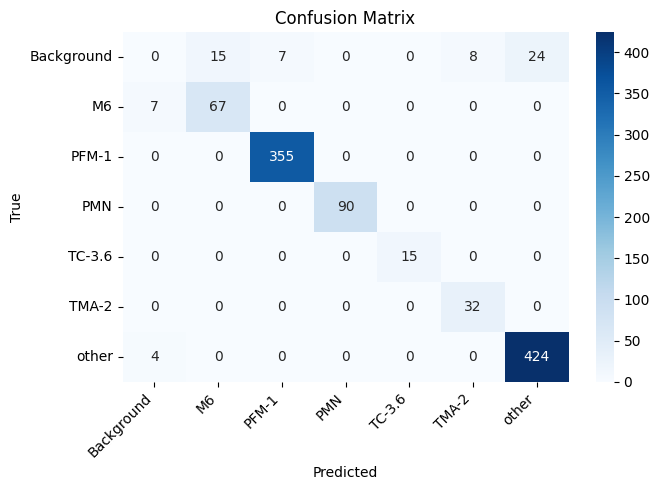

[[  0  15  21   0   0  12  33]
 [  4  70   0   0   0   0   0]
 [  0   0 355   0   0   0   0]
 [  0   0   0  90   0   0   0]
 [  0   0   0   0  15   0   0]
 [  0   0   0   0   0  32   0]
 [  2   0   0   0   0   0 426]]


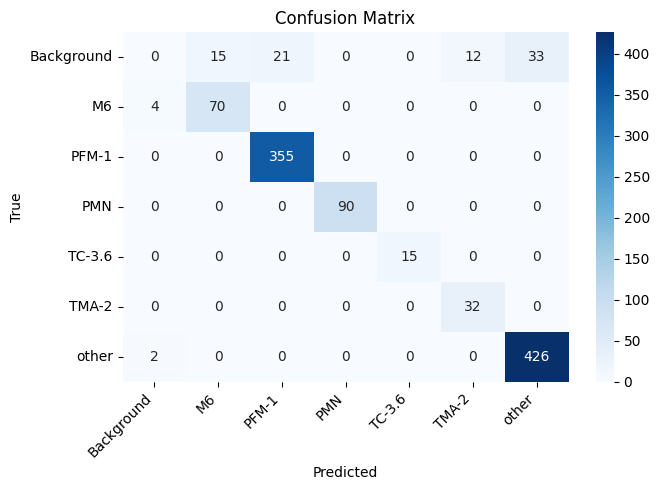

In [ ]:
# Confusion matrices
cm_ensemble = plot_confusion_matrix(matches, CLASS_NAMES)
cm_rgb = plot_confusion_matrix(matches_rgb, CLASS_NAMES)

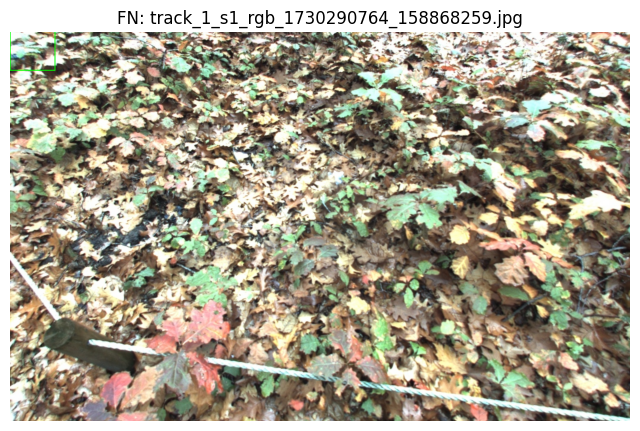

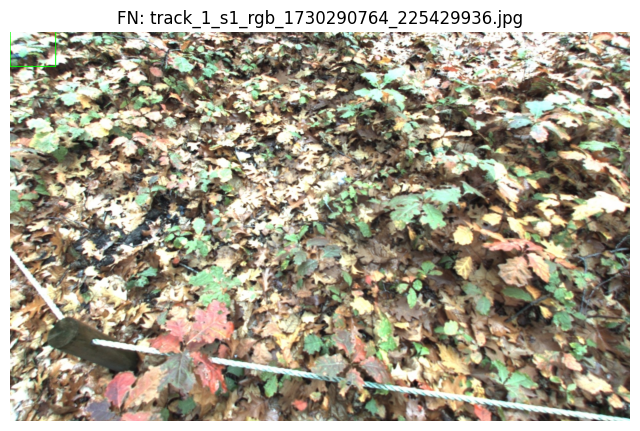

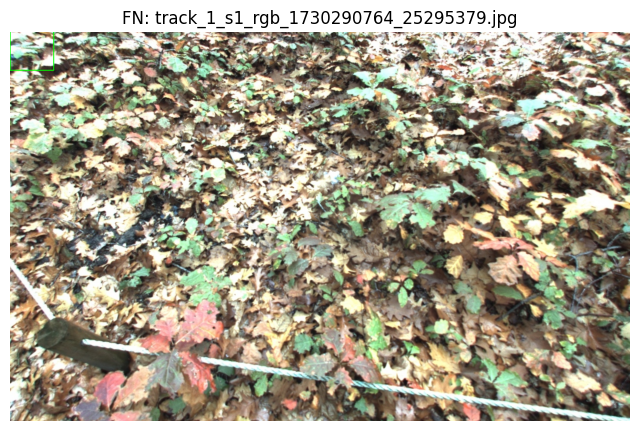

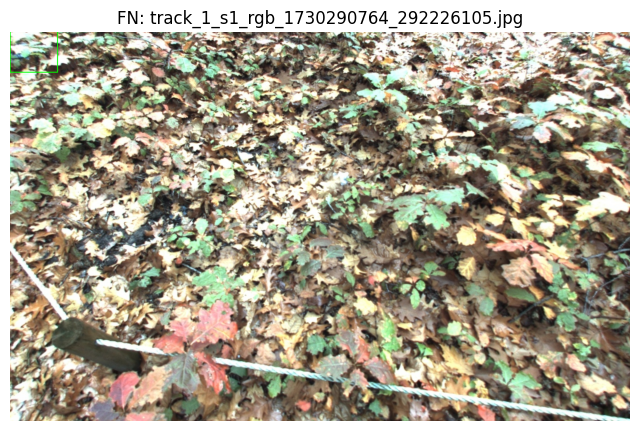

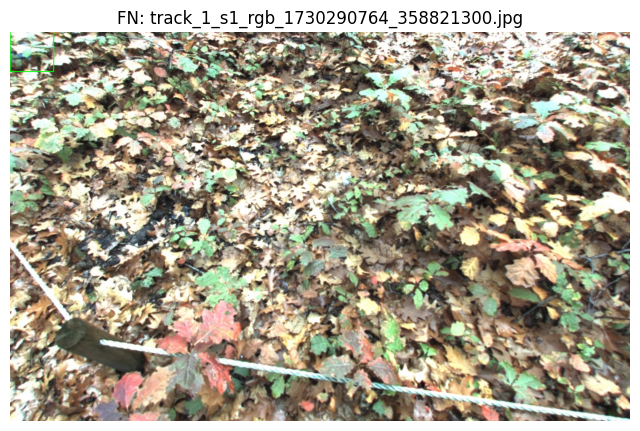

...

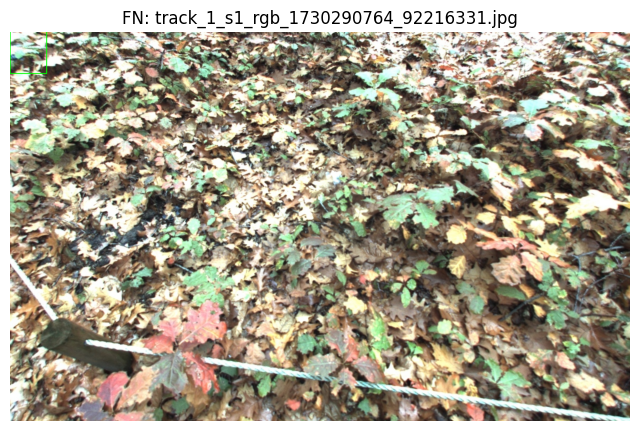

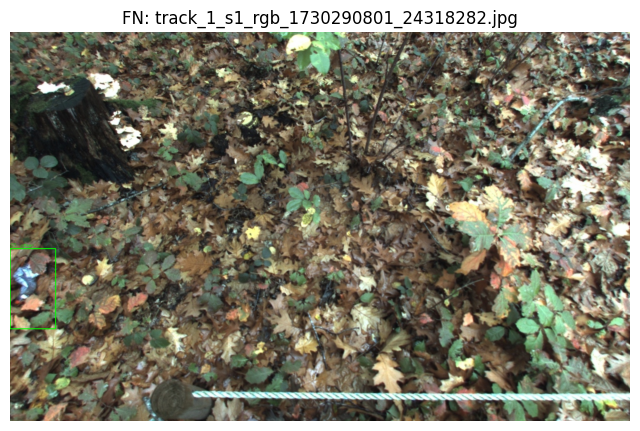

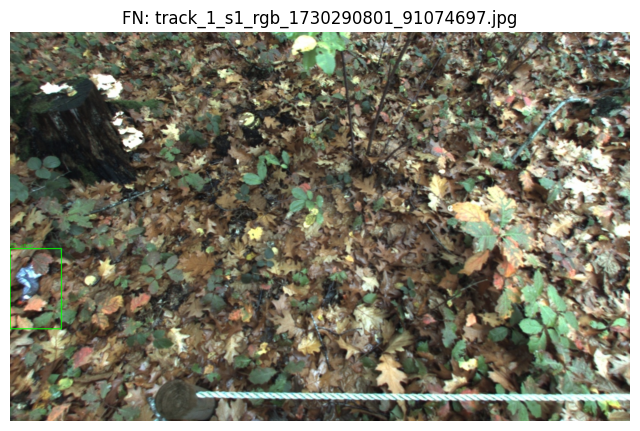

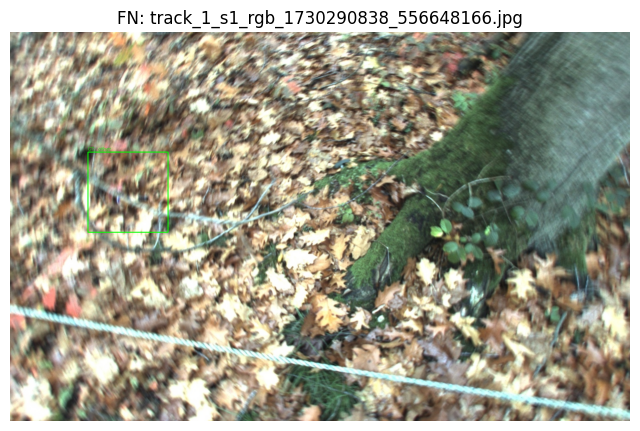

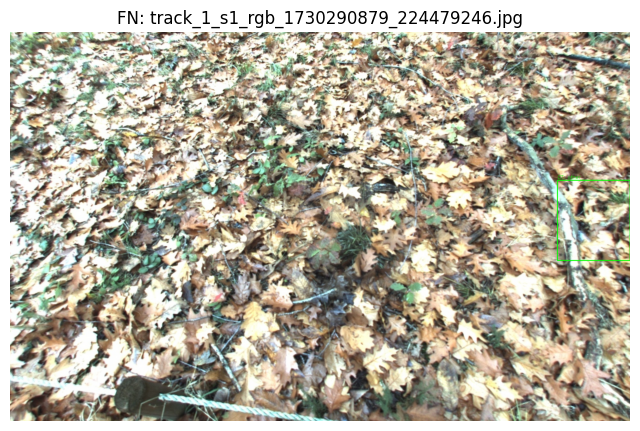

rgb


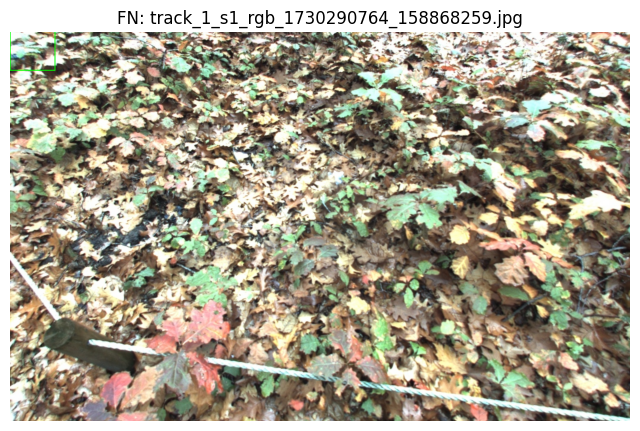

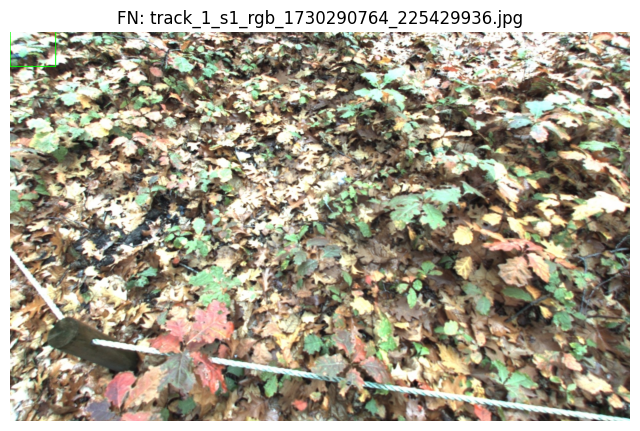

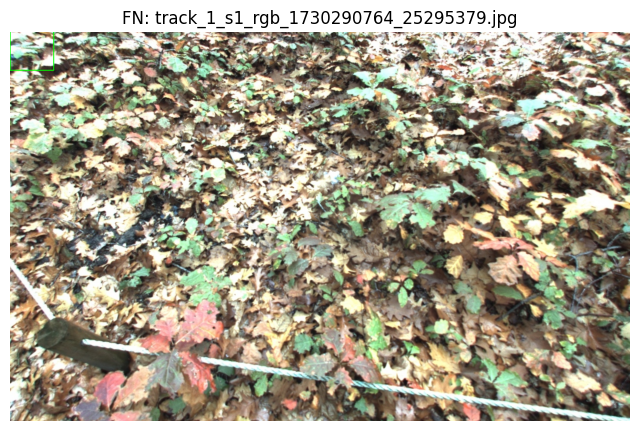

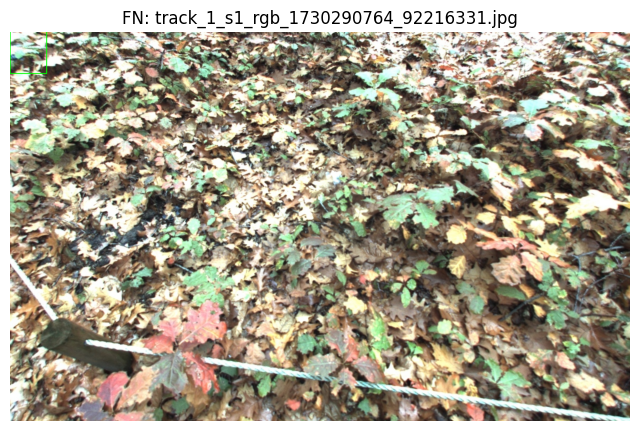

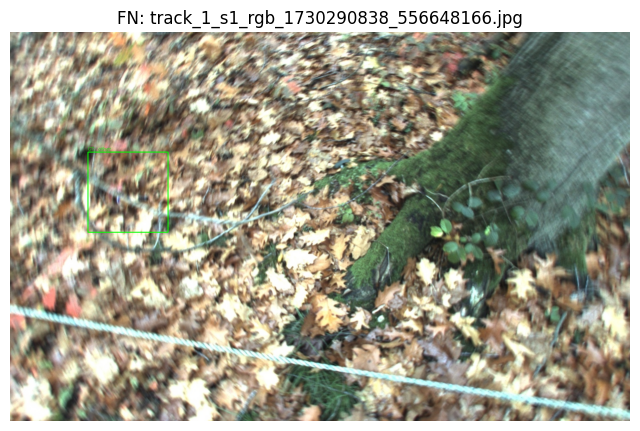

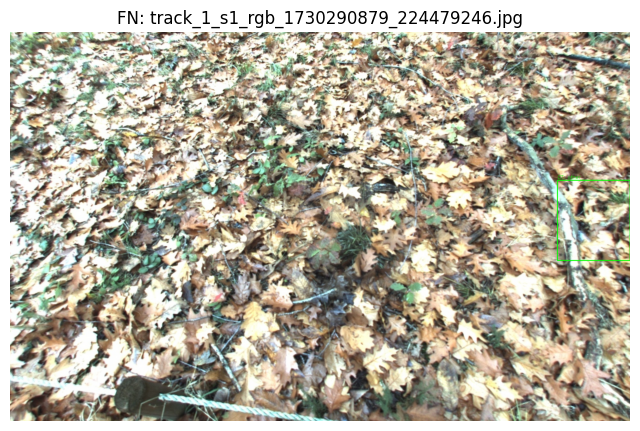

In [ ]:

show_fn_images(matches, rgb_images_path, CLASS_NAMES, max_show=15)
print('rgb')
show_fn_images(matches_rgb, rgb_images_path, CLASS_NAMES, max_show=15)
